<a href="https://colab.research.google.com/github/saimani5/ferroelectric_domains_rVAE/blob/main/Analysis_of_BiFeO3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Prepared by Chris


Mount Google Drive (only needed for saves):

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Import standard modules:

In [ ]:
import os
import numpy as np
import h5py
try:
    import gdown
except ModuleNotFoundError:
    !pip install gdown
    import gdown
import matplotlib.pyplot as plt
import matplotlib.patches as pch
import seaborn as sns
from sklearn import decomposition
from scipy import signal
np.random.seed(0)

Import colormapping tools: colorspacious & papuc

In [ ]:
#colorspacious
try:
    import colorspacious
except ModuleNotFoundError:
    !pip install colorspacious
    import colorspacious

!pip install git+https://github.com/ziatdinovmax/atomai@legacy --upgrade  #install legacy version which is sufficient for this notebook

from atomai import utils
from atomai import atomstat
import atomai as aoi
import torch
import random
torch.manual_seed(0)
torch.cuda.manual_seed_all(0)
torch.backends.cudnn.deterministic=True
np.random.seed(0)
random.seed(0)





#papuc
if not os.path.exists('papuc/'):
    !git clone https://github.com/MTD-group/papuc.git
else:
    !git pull https://github.com/MTD-group/papuc.git papuc/.git        
from importlib.machinery import SourceFileLoader
papuc = SourceFileLoader('papuc', 'papuc/papuc/__init__.py').load_module()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/ziatdinovmax/atomai (to revision legacy) to /tmp/pip-req-build-lim18tqo
  Running command git clone -q https://github.com/ziatdinovmax/atomai /tmp/pip-req-build-lim18tqo
  Running command git checkout -b legacy --track origin/legacy
  Switched to a new branch 'legacy'
  Branch 'legacy' set up to track remote branch 'legacy' from 'origin'.
     |████████████████████████████████| 26.5 MB 1.2 MB/s 
     |████████████████████████████████| 178 kB 92.2 MB/s 
     |████████████████████████████████| 1.1 MB 69.1 MB/s 
     |████████████████████████████████| 865 kB 94.6 MB/s 
  Created wheel for atomai: filename=atomai-0.5.2-py3-none-any.whl size=77557 sha256=b673dbbcf18a0a16f9c9b032b3cdc8b5587cd14b458d091bcaf3fd7da0c56e75
  Stored in directory: /tmp/pip-ephem-wheel-cache-

Cloning into 'papuc'...
remote: Enumerating objects: 188, done.
remote: Counting objects: 100% (24/24), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 188 (delta 8), reused 17 (delta 6), pack-reused 164
Receiving objects: 100% (188/188), 2.66 MiB | 26.74 MiB/s, done.
Resolving deltas: 100% (86/86), done.


Outputs Save Path

In [ ]:
mdirectory = '/content/drive/My Drive/Colab Notebooks/Outputs/rVAE Ferro/'
if not os.path.exists(mdirectory):
    os.makedirs(mdirectory)

Input Files

In [ ]:
#HAADF Image
url = 'https://drive.google.com/uc?id=1Grh6JmAX_t9Ws_kZSachDm7xo8ntm-mE'
imfile = 'HAADF.h5'
gdown.download(url, imfile, quiet=False)

#Parameters
url = 'https://drive.google.com/uc?id=182EFt32zfSOmM68gz08XshIo2o5BNUeC'
parfile = 'atmparams.p'
gdown.download(url, parfile, quiet=False)

# The following file has been changed, so we will work with a new file
# url = 'https://drive.google.com/uc?id=1a5pLLwaXWxWivhaj3iGhtBkDevQrIoNd'
# imstackparfile = 'imstack_params.p'
# gdown.download(url, imstackparfile, quiet=False)

!gdown 1SUJndn6ECDU6XuO9TcClUSL_LM9yjnZF
imstackparfile = 'imstack_paramsw48.p'

Downloading...
From: https://drive.google.com/uc?id=1Grh6JmAX_t9Ws_kZSachDm7xo8ntm-mE
To: /content/HAADF.h5
100%|██████████| 157M/157M [00:03<00:00, 50.0MB/s]
Downloading...
From: https://drive.google.com/uc?id=182EFt32zfSOmM68gz08XshIo2o5BNUeC
To: /content/atmparams.p
100%|██████████| 15.0M/15.0M [00:00<00:00, 88.7MB/s]


Downloading...
From: https://drive.google.com/uc?id=1SUJndn6ECDU6XuO9TcClUSL_LM9yjnZF
To: /content/imstack_paramsw48.p
100% 442M/442M [00:09<00:00, 44.6MB/s]


In [ ]:
#list files
filedir = '/content'
[f for f in os.listdir(filedir)]

['.config',
 'model_no_trans.tar',
 'model_translations_single_LD.tar',
 'atmparams.p',
 'model_translations.tar',
 'HAADF.h5',
 'drive',
 'papuc',
 'imstack_paramsw48.p',
 'sample_data']

In [ ]:
#extract data
imgdata = h5py.File(os.path.join(filedir, imfile), 'r')['MainImage']
imgscl = h5py.File(os.path.join(filedir, imfile), 'r')['Scale']
imgunit = h5py.File(os.path.join(filedir, imfile), 'r')['Units(m)']
#ap = h5py.File(os.path.join(filedir, parfile), 'r')
ap = np.load(os.path.join(filedir, parfile), allow_pickle=True)
print('atom parameters: '+str(ap.keys()))
imp = np.load(os.path.join(filedir, imstackparfile), allow_pickle=True)
print('image stack parameters: '+str(imp.keys()))

atom parameters: dict_keys(['i', 'type', 'xy', 'nbrind', 'nbrvect', 'nbrvalid', 'a_all', 'b_all', 'a', 'b', 'alpha', 'orient', 'vol', 'nbrCOM', 'Pxy', 'Intensity'])
image stack parameters: dict_keys(['i', 'imstack', 'xy', 'a', 'b', 'alpha', 'orient', 'vol', 'Pxy', 'Ia', 'Ir'])


Data formatting

In [ ]:
imsz = np.shape(imp['imstack'])
assert np.ndim(imp['imstack'])==3

feature_arr = np.reshape(imp['imstack'],[imsz[0],imsz[1]*imsz[2]])            #convert images to vectors for training

#screen out images w/ nan values
subI = imp['i']        #subindices used for imstack and following scatter plots (in this case b-sites)
nanind = np.where(~np.any(np.isnan(feature_arr),axis=1))[0]
subI = subI[nanind]
imsz = np.array((np.size(nanind),imsz[1],imsz[2]))
feature_arr = np.reshape(feature_arr[nanind,:],imsz)

#crop out top region of film (many b-site fit failures)
xmax = 2200
ind = np.where(imp['xy'][nanind,0]<=xmax)[0]
subI_r = subI[ind]
subI_r = subI

print('nan-value images removed: '+str(np.size(imp['i'],axis=0)-np.size(nanind)))
print('defined ROI images removed: '+str(np.size(nanind)-np.size(subI_r)))
print('image stack size (includes outside ROI): '+str(imsz))

#normalize imagestack
feature_arr = feature_arr/feature_arr.max()

nan-value images removed: 512
defined ROI images removed: 0
image stack size (includes outside ROI): [23340    48    48]


Colorization

In [ ]:
#Pxy polar coords
Pmag = (np.sum(ap['Pxy'][subI,:]**2,axis=1))**.5 
Pdir = np.arctan2(ap['Pxy'][subI,1],ap['Pxy'][subI,0]).ravel()

In [ ]:
my_map = papuc.example_maps.colormaps_CIELAB['perimeter1']  #vector colormap
#Pxy colors
cP = my_map(Pdir,np.clip(Pmag/np.nanpercentile(Pmag,90),0,1))

papuc/papuc/core.py:28: RuntimeWarning: invalid value encountered in remainder
  values = splev( np.mod(theta-theta0 ,period) +theta0, tck)


L*a*b*/sRGB1 color [74.         43.32744987  0.07916144] / [1.00231165 0.58933091 0.71890533] 
-----> clipped to [ 7.39280225e+01  4.31251293e+01 -3.45887987e-02] / [1.         0.58933091 0.71890533]
L*a*b*/sRGB1 color [74.         39.48834041 11.61248657] / [1.00234225 0.59911648 0.63698712] 
-----> clipped to [73.92706751 39.27394343 11.49897974] / [1.         0.59911648 0.63698712]
L*a*b*/sRGB1 color [74.         35.77047749 23.1853857 ] / [1.00013692 0.60859702 0.5542359 ] 
-----> clipped to [73.99574623 35.75744179 23.17889669] / [1.         0.60859702 0.5542359 ]


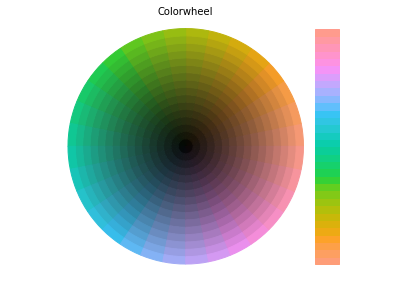

In [ ]:
fig, ax = plt.subplots()
from papuc.analysis import plot_colorwheel,  UCS_cone_3D
plot_colorwheel(ax, my_map)
fig.tight_layout(pad= 0.1)
plt.axis('off')
# plt.savefig(mdirectory+'Colorwheel.png')
plt.savefig('colorwheel.png', dpi = 300)
plt.show()

Display input data (incl. Figure 1a, b)

scalebar is size: 1e-08


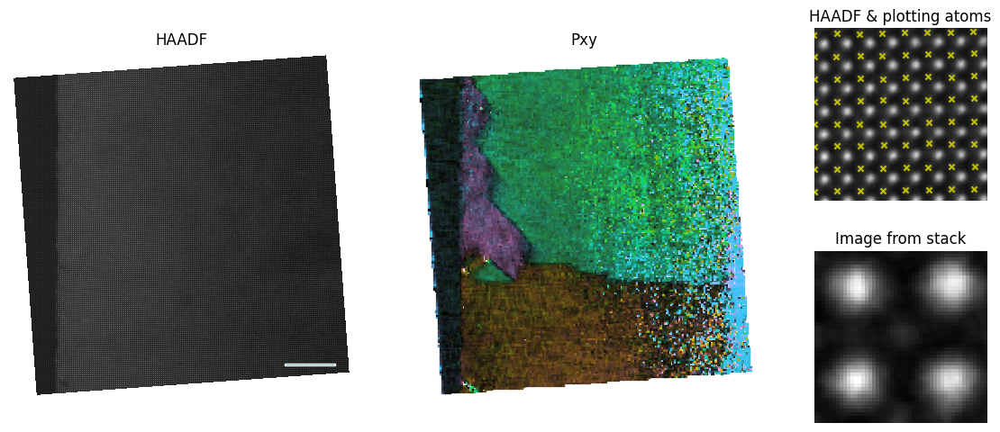

In [ ]:
#selected parameter to plot: 'Pxy'
Pxybounds = np.nanpercentile(np.abs(np.hstack((ap['Pxy'][:,0],ap['Pxy'][:,1]))),95)

#Scalebar properties
sclbar = 10*10**-9
sclbarpos = [.8, .1]
sclbarwidth = 20

#Figure
fig = plt.figure(figsize=(14, 6), dpi=100)
gspec = plt.GridSpec(ncols=3, nrows=2, figure=fig, width_ratios = [2,2,1])

#HAADF Main Image
ax0 = fig.add_subplot(gspec[:,0])
ax0.imshow(imgdata,origin='bottom',cmap='gray')
#ax0.set_axis_off()
ax0.set_title('HAADF')
xl = ax0.get_xlim()
yl = ax0.get_ylim()
ax0.set_axis_off()
#scalebar
x = np.array((0,1,1,0))*sclbar/(imgscl[1]*imgunit[0]) + sclbarpos[0]*np.shape(imgdata)[1]
y = np.array((0,0,1,1))*sclbarwidth + sclbarpos[1]*np.shape(imgdata)[0]
xy = np.vstack((x, y)).T
sclbarrect = pch.Polygon(xy, edgecolor=[1,1,1], fill = True)
ax0.add_patch(sclbarrect)
print('scalebar is size: '+str(sclbar))

#Plot variable Pxy
ax1 = fig.add_subplot(gspec[:,1])
ax1.scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=cP, s=1, marker='s')
ax1.set_xlim(xl)
ax1.set_ylim(yl)
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_axis_off()
ax1.set_aspect(1)
ax1.set_title('Pxy')

#subindex of atoms used for plotting / image stack centers
ax3 = fig.add_subplot(gspec[0,2])
ax3.imshow(imgdata,origin='bottom',cmap='gray')
ax3.scatter(ap['xy'][subI,0],ap['xy'][subI,1],c='y',s=20,marker='x')
ax3.set_title('HAADF & plotting atoms')
ax3.set_xlim([2000,2200])
ax3.set_ylim([2000,2200])
ax3.set_axis_off()

#subindex of atoms used for plotting / image stack centers
ax4 = fig.add_subplot(gspec[1,2])
i=0
ax4.imshow(imp['imstack'][i,:,:],origin='bottom',cmap='gray')
ax4.set_title('Image from stack')
ax4.set_axis_off()

plt.show()
fig.savefig(mdirectory+'HAADFs.png')

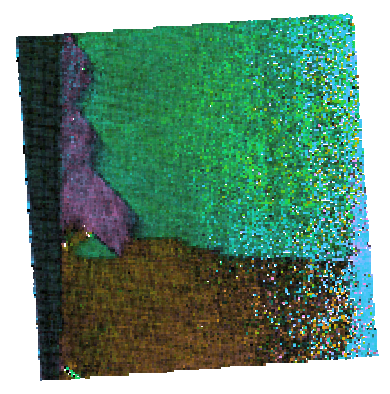

In [ ]:
fig, ax = plt.subplots(figsize = (7,7))

ax.scatter(ap['xy'][subI,0], ap['xy'][subI,1], c = cP, s=2, marker='s')
ax.set_xlim(xl)
ax.set_ylim(yl)
ax.set_xticks([])
ax.set_yticks([])
ax.set_axis_off()
ax.set_aspect(1)
# ax.set_title('Pxy')
plt.savefig('polarization_field.png', dpi = 300)

Image 1c: Dislocation

scalebar is size: 2e-09


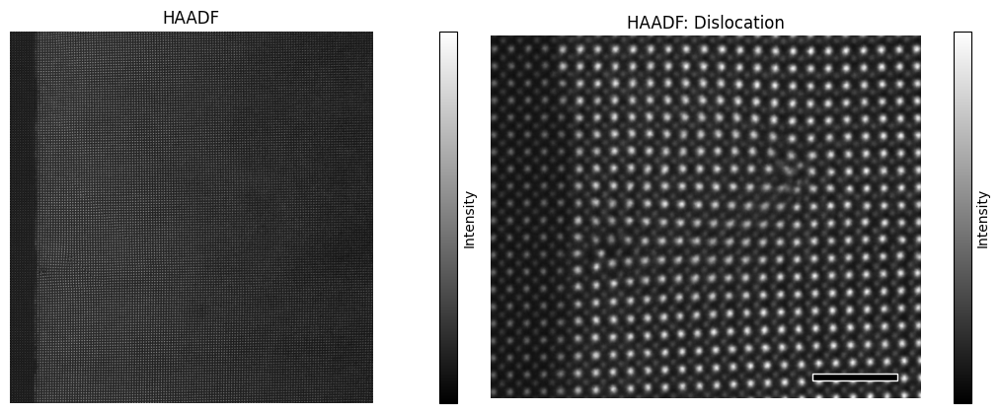

In [ ]:
#image xy limits
main_subI = [350, 4000, 350, 4100]
disl_subI = [500, 1150, 1450, 2000]

#Scalebar properties
sclbar = 2*10**-9
sclbarpos = [.75, .05]
sclbarwidth = 10

#plotting value limits
adir_bounds = [-4, 4]

#Figure
fig = plt.figure(figsize=(13, 5), dpi=100)

ncol = 2
w_colorbar = .04
w_space = .15
widths = np.tile(np.array((1,w_colorbar)),ncol)
gspec = plt.GridSpec(ncols=ncol*2, nrows=1, figure=fig, width_ratios = widths, wspace=w_space)

#Full Image
ax0 = fig.add_subplot(gspec[0,0])
im0 = ax0.imshow(imgdata,origin='bottom',cmap='gray')
ax0.set_title('HAADF')
ax0.axis(main_subI)
ax0.set_axis_off()
ax0.set_label('')
#colorbar
ax0_l = fig.add_subplot(gspec[0,1])
plt.colorbar(im0,cax=ax0_l,label='Intensity',ticks=[])

#Dislocation
ax1 = fig.add_subplot(gspec[0,2])
im1 = ax1.imshow(imgdata, origin='bottom',cmap='gray')
ax1.set_title('HAADF: Dislocation')
ax1.axis(disl_subI)
ax1.set_axis_off()
#colorbar
ax1_l = fig.add_subplot(gspec[0,3])
plt.colorbar(im1,cax=ax1_l,label='Intensity',ticks=[])

#scalebar
x = np.array((0,1,1,0))*sclbar/(imgscl[1]*imgunit[0]) + sclbarpos[0]*(disl_subI[1]-disl_subI[0]) + disl_subI[0]
y = np.array((0,0,1,1))*sclbarwidth + sclbarpos[1]*(disl_subI[3]-disl_subI[2])+disl_subI[2]
xy = np.vstack((x, y)).T
sclbarrect = pch.Polygon(xy, edgecolor=[1,1,1], fill = True, facecolor=[0,0,0])
ax1.add_patch(sclbarrect)
print('scalebar is size: '+str(sclbar))

fig.savefig(mdirectory+'im1_Disl_Image.png')

scalebar is size: 2e-09


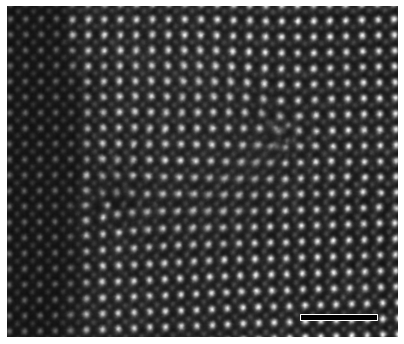

In [ ]:
fig, ax1 = plt.subplots(figsize = (7,7))
im1 = ax1.imshow(imgdata, origin='bottom',cmap='gray')
# ax1.set_title('HAADF: Dislocation')
ax1.axis(disl_subI)
ax1.set_axis_off()

#scalebar
x = np.array((0,1,1,0))*sclbar/(imgscl[1]*imgunit[0]) + sclbarpos[0]*(disl_subI[1]-disl_subI[0]) + disl_subI[0]
y = np.array((0,0,1,1))*sclbarwidth + sclbarpos[1]*(disl_subI[3]-disl_subI[2])+disl_subI[2]
xy = np.vstack((x, y)).T
sclbarrect = pch.Polygon(xy, edgecolor=[1,1,1], fill = True, facecolor=[0,0,0])
ax1.add_patch(sclbarrect)
print('scalebar is size: '+str(sclbar))

plt.savefig('edge_dislocation.png', dpi = 300)

#rVAE

Here we will use 3 models of rVAE  
1) Translations turned off i.e., (angle, L1, L2) are the latent variables. Num of Latent variables = 3  
2) Translations turned on and with one Latent variables. Num of Latent variables = 4  
3) Translations turned on with 2 Latent variables. Num of Latent variables = 5

In [ ]:
# # Being extra careful with the seeds
# torch.manual_seed(512)
# torch.cuda.manual_seed_all(512)
# torch.backends.cudnn.deterministic=True
# np.random.seed(512)
# random.seed(512)


# rvae1 = atomstat.rVAE(feature_arr, conv_encoder = True, training_cycles=100, batch_size=32, translation = False)
# # rvae2 = atomstat.rVAE(feature_arr, latent_dim = 1, conv_encoder = True, training_cycles=100, batch_size=32, translation = True)
# # rvae3 = atomstat.rVAE(feature_arr, latent_dim = 2, conv_encoder = True, training_cycles=100, batch_size=32, translation = True)

# rvae1.run()
# # rvae2.run()
# # rvae3.run()

/usr/local/lib/python3.7/dist-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Epoch: 1/100, Training loss: 21.3064, Test loss: 20.5031
Epoch: 2/100, Training loss: 20.4380, Test loss: 20.3014
Epoch: 3/100, Training loss: 20.0674, Test loss: 19.4467
Epoch: 4/100, Training loss: 19.0553, Test loss: 18.4688
Epoch: 5/100, Training loss: 17.7801, Test loss: 17.0170
Epoch: 6/100, Training loss: 16.5962, Test loss: 16.8437
Epoch: 7/100, Training loss: 15.7142, Test loss: 15.0100
Epoch: 8/100, Training loss: 14.9746, Test loss: 14.6779
Epoch: 9/100, Training loss: 14.6732, Test loss: 14.3881
Epoch: 10/100, Training loss: 14.3546, Test loss: 14.0863
Epoch: 11/100, Training loss: 14.2359, Test loss: 13.9083
Epoch: 12/100, Training loss: 14.0319, Test loss: 14.7040
Epoch: 13/100, Training loss: 13.8651, Test loss: 13.5395
Epoch: 14/100, Training loss: 13.7375, Test loss: 13.5389
Epoch: 15/100, Training loss: 13.6502, Test loss: 13.5140
Epoch: 16/100, Training loss: 13.5312, Test loss: 13.2035
Epoch: 17/100, Training loss: 13.3899, Test loss: 13.0779
Epoch: 18/100, Training

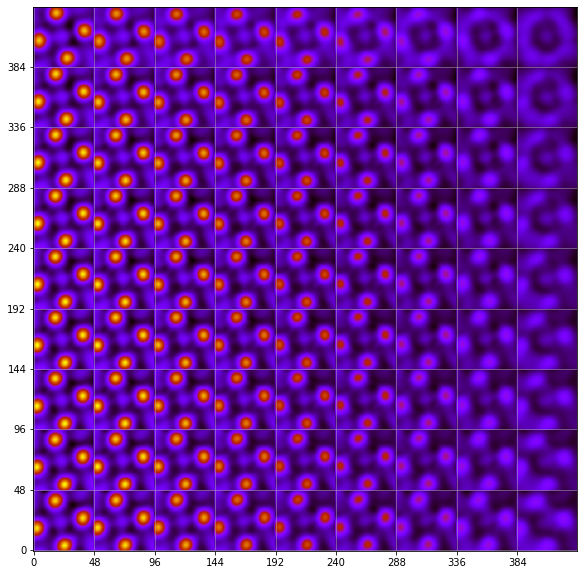

In [ ]:
# rvae1.manifold2d(draw_grid = True, origin = 'lower')

In [ ]:
# Loading the saved models of all three vaes
rvae1 = aoi.load_vae_model('model_no_trans.tar')
rvae2 = aoi.load_vae_model('model_translations_single_LD.tar')
rvae3 = aoi.load_vae_model('model_translations.tar')

##rVAE1: Model with no translations. Number of latent variables = 3

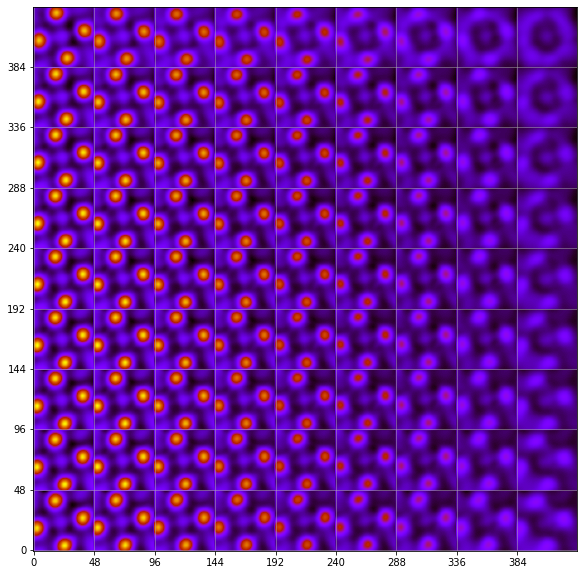

In [ ]:
rvae1.manifold2d(draw_grid = True, origin = 'lower')

In [ ]:
z_mean1, z_sd1 = rvae1.encode(feature_arr)
z11 , z13 = z_mean1[:,0], z_mean1[:, 1:3]

In [ ]:
#a manual offset to register orientations of rvae to Pxy
ang_offset = np.deg2rad(-100)

# Normalizing the latent varibles to color the phase-amplitude images.
l11, l12 = z13[:,0], z13[:,1]

#percentile
lrng = [1,99]
l11 = l11-np.percentile(l11,lrng[0])
l11 = (l11/np.percentile(l11,lrng[1]))

l12 = l12-np.percentile(l12,lrng[0])
l12 = (l12/np.percentile(l12,lrng[1]))

#Colormaps
my_map = papuc.example_maps.colormaps_CIELAB['perimeter1']  #vector colormap

#latent colors
ang = np.mod(z11+ang_offset,2*np.pi)
c11_ = my_map(ang, np.clip(l11,0,1))
c12_ = my_map(ang, np.clip(l12,0,1))
crvae = my_map(ang, np.ones_like(l11))
#Pxy colors
cP = my_map(Pdir,np.clip(Pmag/np.nanpercentile(Pmag,90),0,1))

#Pxy polar coords
Pmag = (np.sum(ap['Pxy'][subI,:]**2,axis=1))**.5 
Pdir = np.arctan2(ap['Pxy'][subI,1],ap['Pxy'][subI,0]).ravel()

papuc/papuc/core.py:28: RuntimeWarning: invalid value encountered in remainder
  values = splev( np.mod(theta-theta0 ,period) +theta0, tck)


Text(0.5, 1.0, 'L2-colorized')

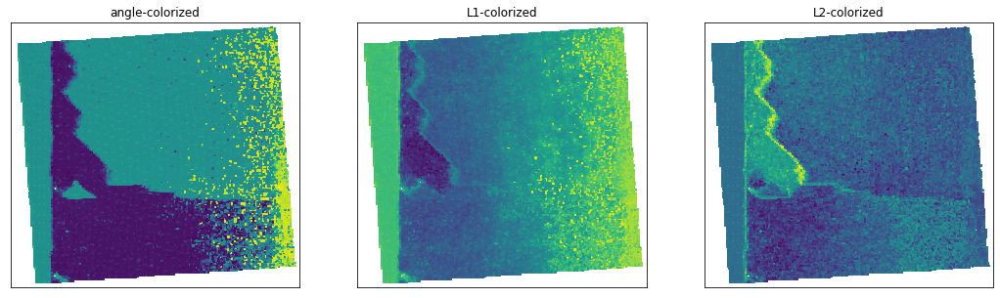

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(18, 5))

ax[0].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=z11, s=2, marker='s')
ax[0].set_xlim(xl)
ax[0].set_ylim(yl)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_title('angle-colorized')

ax[1].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=z13[:,0], s=2, marker='s')
ax[1].set_xlim(xl)
ax[1].set_ylim(yl)
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_title('L1-colorized')

ax[2].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=z13[:,1], s=2, marker='s')
ax[2].set_xlim(xl)
ax[2].set_ylim(yl)
ax[2].set_xticks([])
ax[2].set_yticks([])
ax[2].set_title('L2-colorized')

# plt.savefig('latent_variables_no_translations.png', dpi = 300)

Text(0.5, 1.0, 'angle-colorized Latent 2')

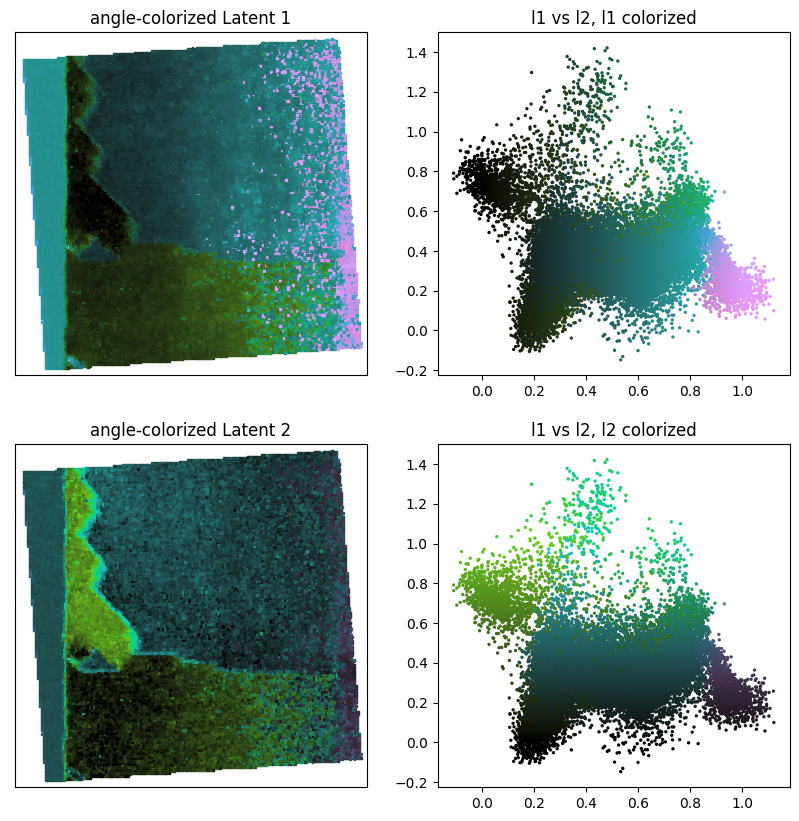

In [ ]:
# Phase Amplitude plots

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(10, 10), dpi=100)
ax[0,1].scatter(l11,l12,s=2,c=c11_)
ax[0,1].set_title('l1 vs l2, l1 colorized')
ax[1,1].scatter(l11,l12,s=2,c=c12_)
ax[1,1].set_title('l1 vs l2, l2 colorized')
ax[0,0].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=c11_, s=2, marker='s')
ax[0,0].set_xlim(xl)
ax[0,0].set_ylim(yl)
ax[0,0].set_xticks([])
ax[0,0].set_yticks([])
ax[0,0].set_title('angle-colorized Latent 1')
ax[1,0].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=c12_, s=2, marker='s')
ax[1,0].set_xlim(xl)
ax[1,0].set_ylim(yl)
ax[1,0].set_xticks([])
ax[1,0].set_yticks([])
ax[1,0].set_title('angle-colorized Latent 2')

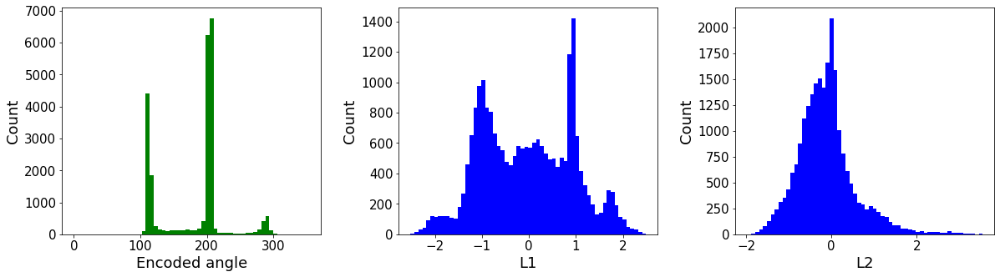

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(20, 5))
#angles
ax[0].hist(np.rad2deg(np.mod(z11+ang_offset,2*np.pi)), bins=np.arange(0,360,6), color='g')

# ax[1,0].hist(np.rad2deg(np.mod(Pdir,2*np.pi)), bins=np.arange(0,360,6), color='g')

#ax[0,0].hist(np.mod(z1,2*np.pi), bins=60, color='green', range=((0,2*np.pi)))
ax[1].hist(z13[:, 0], bins=60, color='b')
ax[2].hist(z13[:, 1], bins=60, color='b')
ax[0].set_xlabel("Encoded angle", fontsize=18)
# ax[1,0].set_xlabel("Pxy angle", fontsize=18)
ax[1].set_xlabel("L1", fontsize=18) #X-offset for rVAE, L1 for rrVAE
ax[2].set_xlabel("L2", fontsize=18) #Y-offset for rVAE, L2 for rrVAE

#
# ax[1].set_axis_off()
# ax[2].set_axis_off()

for _ax in fig.axes:
    _ax.set_ylabel("Count", fontsize=18)
    _ax.tick_params(labelsize=15)
plt.subplots_adjust(wspace=0.3,hspace=0.3)

# plt.savefig('histograms_no_translations.png', dpi = 300)

##rVAE2: Model with translations and one latent dimensions. Number of latent variables = 4

In [ ]:
z_mean2, z_sd2 = rvae2.encode(feature_arr)
z21 , z22,  z23 = z_mean2[:,0], z_mean2[:, 1:3], z_mean2[:,3]

# z21: Angle
# z22: Translations
# z23: Latent variable

In [ ]:
#a manual offset to register orientations of rvae to Pxy
ang_offset = np.deg2rad(-100)

# Normalizing the latent varibles to color the phase-amplitude images.
t21, t22 = z22[:,0], z22[:,1]
l21 = z23

#percentile
lrng = [1,99]
l21 = l21-np.percentile(l21,lrng[0])
l21 = (l21/np.percentile(l21,lrng[1]))

t21 = t21-np.percentile(t21,lrng[0])
t21 = (t21/np.percentile(t21,lrng[1]))

t22 = t22-np.percentile(t22,lrng[0])
t22 = (t22/np.percentile(t22,lrng[1]))

#Colormaps
my_map = papuc.example_maps.colormaps_CIELAB['perimeter1']  #vector colormap

#latent colors
ang = np.mod(z21+ang_offset,2*np.pi)
c21_ = my_map(ang, np.clip(l21,0,1))
t21_ = my_map(ang, np.clip(t21,0,1))
t22_ = my_map(ang, np.clip(t22,0,1))


#Pxy colors
cP = my_map(Pdir,np.clip(Pmag/np.nanpercentile(Pmag,90),0,1))

#Pxy polar coords
Pmag = (np.sum(ap['Pxy'][subI,:]**2,axis=1))**.5 
Pdir = np.arctan2(ap['Pxy'][subI,1],ap['Pxy'][subI,0]).ravel()

L*a*b*/sRGB1 color [74.         41.1975986   6.44714139] / [1.00265495 0.59475308 0.67370619] 
-----> clipped to [73.91730461 40.95924442  6.31749171] / [1.         0.59475308 0.67370619]
L*a*b*/sRGB1 color [74.         37.41598757 17.9871811 ] / [1.00134491 0.60440694 0.59151935] 
-----> clipped to [73.95816451 37.29009519 17.92274143] / [1.         0.60440694 0.59151935]
L*a*b*/sRGB1 color [74.         43.1332013   0.65795949] / [1.00237932 0.58982429 0.71479838] 
-----> clipped to [73.92591054 42.92446168  0.54095131] / [1.         0.58982429 0.71479838]
L*a*b*/sRGB1 color [74.         43.83983946 -1.44647487] / [1.00209606 0.58803092 0.72973063] 
-----> clipped to [73.93474957 43.65754872 -1.54977522] / [1.         0.58803092 0.72973063]
L*a*b*/sRGB1 color [74.         40.74829647  7.79889461] / [1.0026208  0.59589948 0.66410399] 
-----> clipped to [73.918371   40.51178559  7.67115218] / [1.         0.59589948 0.66410399]
L*a*b*/sRGB1 color [74.         39.79216135 10.68939862] / [

papuc/papuc/core.py:28: RuntimeWarning: invalid value encountered in remainder
  values = splev( np.mod(theta-theta0 ,period) +theta0, tck)


Text(0.5, 1.0, 'Y_offset-colorized')

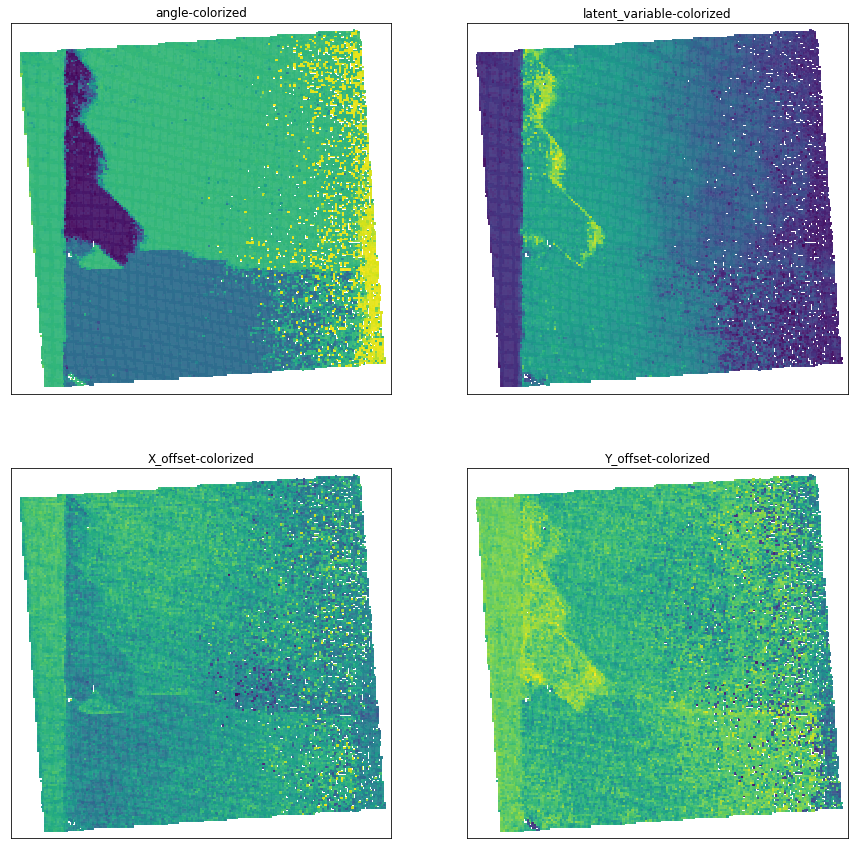

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(15, 15))

ax[0,0].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=z21, s=2, marker='s')
ax[0,0].set_xlim(xl)
ax[0,0].set_ylim(yl)
ax[0,0].set_xticks([])
ax[0,0].set_yticks([])
ax[0,0].set_title('angle-colorized')

ax[0,1].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=l21, s=2, marker='s')
ax[0,1].set_xlim(xl)
ax[0,1].set_ylim(yl)
ax[0,1].set_xticks([])
ax[0,1].set_yticks([])
ax[0,1].set_title('latent_variable-colorized')

ax[1,0].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=t21, s=2, marker='s')
ax[1,0].set_xlim(xl)
ax[1,0].set_ylim(yl)
ax[1,0].set_xticks([])
ax[1,0].set_yticks([])
ax[1,0].set_title('X_offset-colorized')

ax[1,1].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=t22, s=2, marker='s')
ax[1,1].set_xlim(xl)
ax[1,1].set_ylim(yl)
ax[1,1].set_xticks([])
ax[1,1].set_yticks([])
ax[1,1].set_title('Y_offset-colorized')

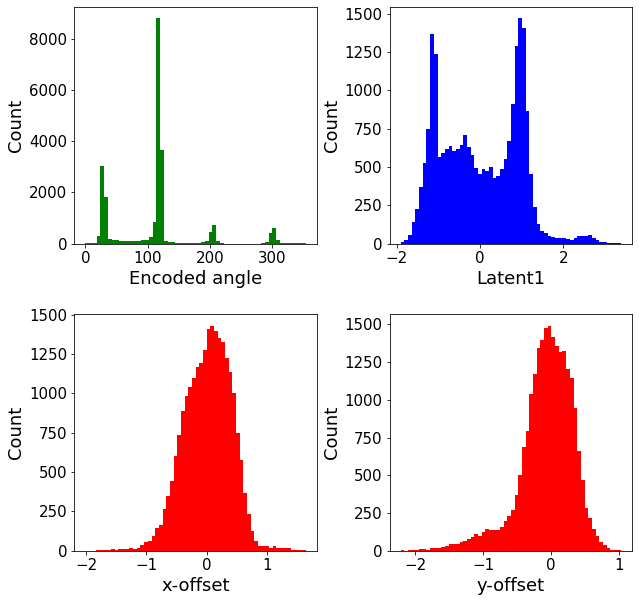

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(10, 10))
#angles
ax[0,0].hist(np.rad2deg(np.mod(z21+ang_offset,2*np.pi)), bins=np.arange(0,360,6), color='g')
#Latent variable
ax[0,1].hist(z23, bins=60, color='blue')

#Translation/offsets
ax[1,0].hist(z22[:, 0], bins=60, color='r')
ax[1,1].hist(z22[:, 1], bins=60, color='r')

ax[0,0].set_xlabel("Encoded angle", fontsize=18)
ax[0,1].set_xlabel("Latent1", fontsize=18)
ax[1,0].set_xlabel("x-offset", fontsize=18)
ax[1,1].set_xlabel("y-offset", fontsize=18)


for _ax in fig.axes:
    _ax.set_ylabel("Count", fontsize=18)
    _ax.tick_params(labelsize=15)
plt.subplots_adjust(wspace=0.3,hspace=0.3)

Text(0.5, 1.0, 'X vs Y offsets, Y-offset colorized')

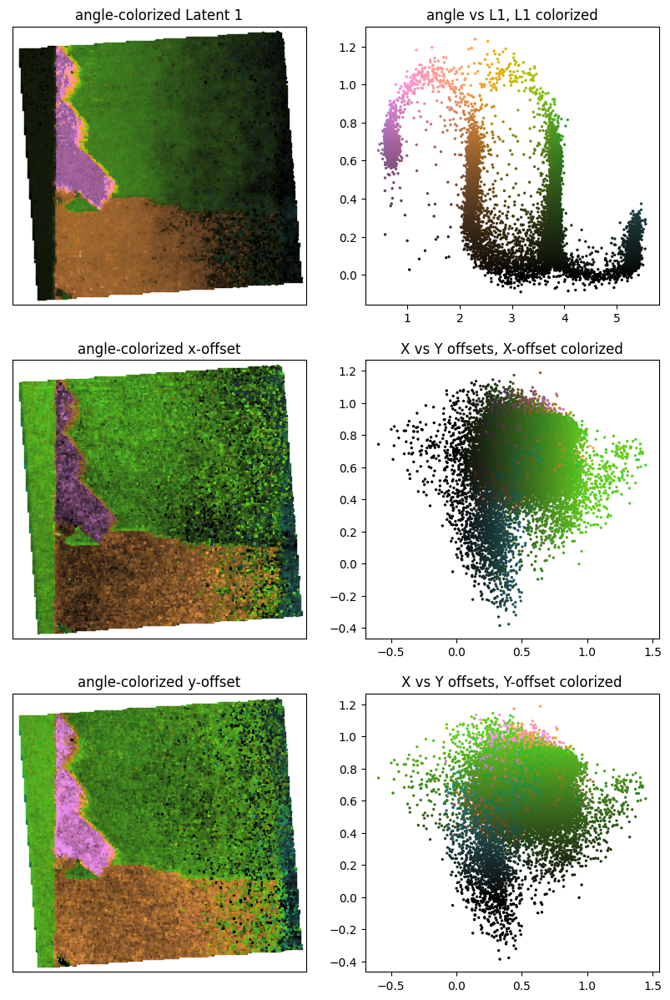

In [ ]:
# Phase-Amplitude Plots

fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(10, 15), dpi=100)
ax[0,0].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=c21_, s=2, marker='s')
ax[0,0].set_xlim(xl)
ax[0,0].set_ylim(yl)
ax[0,0].set_xticks([])
ax[0,0].set_yticks([])
ax[0,0].set_title('angle-colorized Latent 1')

ax[0,1].scatter(z21,l21,s=2,c=c21_)
ax[0,1].set_title('angle vs L1, L1 colorized')


ax[1,0].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=t21_, s=2, marker='s')
ax[1,0].set_xlim(xl)
ax[1,0].set_ylim(yl)
ax[1,0].set_xticks([])
ax[1,0].set_yticks([])
ax[1,0].set_title('angle-colorized x-offset')


ax[1,1].scatter(t21,t22,s=2,c=t21_)
ax[1,1].set_title('X vs Y offsets, X-offset colorized')



ax[2,0].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=t22_, s=2, marker='s')
ax[2,0].set_xlim(xl)
ax[2,0].set_ylim(yl)
ax[2,0].set_xticks([])
ax[2,0].set_yticks([])
ax[2,0].set_title('angle-colorized y-offset')

ax[2,1].scatter(t21,t22,s=2,c=t22_)
ax[2,1].set_title('X vs Y offsets, Y-offset colorized')

##rVAE3: Model with translations and two latent dimensions. Number of latent variables = 5

In [ ]:
z_mean3, z_sd3 = rvae3.encode(feature_arr)
z31 , z32,  z33 = z_mean3[:,0], z_mean3[:, 1:3], z_mean3[:,3:]

# z31: Angle
# z32: Translations
# z33: Latent variables

In [ ]:
#a manual offset to register orientations of rvae to Pxy
ang_offset = np.deg2rad(-100)

# Normalizing the latent varibles to color the phase-amplitude images.
t31, t32 = z32[:,0], z32[:,1]
l31, l32 = z33[:,0], z33[:,1]


#percentile
lrng = [1,99]
l31 = l31-np.percentile(l31,lrng[0])
l31 = (l31/np.percentile(l31,lrng[1]))

l32 = l32-np.percentile(l32,lrng[0])
l32 = (l32/np.percentile(l32,lrng[1]))

t31 = t31-np.percentile(t31,lrng[0])
t31 = (t31/np.percentile(t31,lrng[1]))

t32 = t32-np.percentile(t32,lrng[0])
t32 = (t32/np.percentile(t32,lrng[1]))

#Colormaps
my_map = papuc.example_maps.colormaps_CIELAB['perimeter1']  #vector colormap

#latent colors
ang = np.mod(z21+ang_offset,2*np.pi)
c31_ = my_map(ang, np.clip(l31,0,1))
c32_ = my_map(ang, np.clip(l32,0,1))
t31_ = my_map(ang, np.clip(t31,0,1))
t32_ = my_map(ang, np.clip(t32,0,1))


#Pxy colors
cP = my_map(Pdir,np.clip(Pmag/np.nanpercentile(Pmag,90),0,1))

#Pxy polar coords
Pmag = (np.sum(ap['Pxy'][subI,:]**2,axis=1))**.5 
Pdir = np.arctan2(ap['Pxy'][subI,1],ap['Pxy'][subI,0]).ravel()

L*a*b*/sRGB1 color [74.         43.83983946 -1.44647487] / [1.00209606 0.58803092 0.72973063] 
-----> clipped to [73.93474957 43.65754872 -1.54977522] / [1.         0.58803092 0.72973063]
L*a*b*/sRGB1 color [74.         40.73941134  7.82566462] / [1.00261977 0.59592216 0.66391378] 
-----> clipped to [73.91840316 40.50296932  7.69797724] / [1.         0.59592216 0.66391378]
L*a*b*/sRGB1 color [74.         43.72257466 -1.09744007] / [1.00215021 0.58832824 0.727254  ] 
-----> clipped to [73.93306011 43.5353009  -1.20337303] / [1.         0.58832824 0.727254  ]
L*a*b*/sRGB1 color [74.         45.76898775 -7.18694839] / [1.00076851 0.58316111 0.77047352] 
-----> clipped to [73.97610829 45.70378591 -7.22500492] / [1.         0.58316111 0.77047352]
L*a*b*/sRGB1 color [74.         45.29757571 -5.7834196 ] / [1.00117224 0.58434682 0.76050917] 
-----> clipped to [73.96354198 45.1975038  -5.84140951] / [1.         0.58434682 0.76050917]
L*a*b*/sRGB1 color [74.         37.01976134 19.22547155] / [

papuc/papuc/core.py:28: RuntimeWarning: invalid value encountered in remainder
  values = splev( np.mod(theta-theta0 ,period) +theta0, tck)


Text(0.5, 1.0, 'L2-colorized')

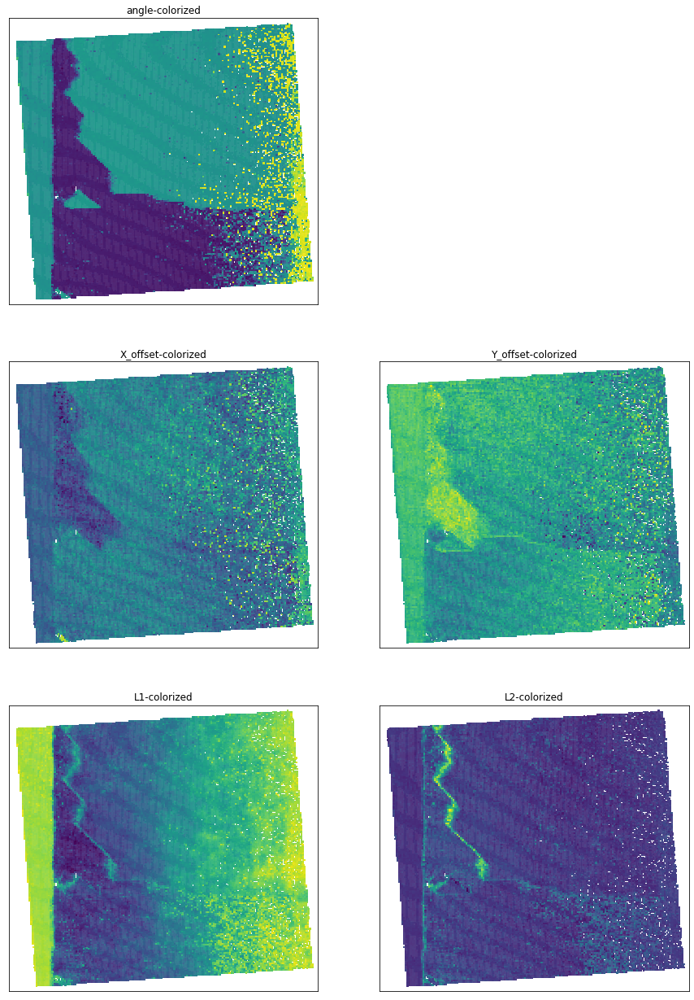

In [ ]:
fig, ax = plt.subplots(3, 2, figsize=(15, 22))

ax[0,0].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=z31, s=2, marker='s')
ax[0,0].set_xlim(xl)
ax[0,0].set_ylim(yl)
ax[0,0].set_xticks([])
ax[0,0].set_yticks([])
ax[0,0].set_title('angle-colorized')

ax[0,1].set_axis_off()


ax[1,0].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=t31, s=2, marker='s')
ax[1,0].set_xlim(xl)
ax[1,0].set_ylim(yl)
ax[1,0].set_xticks([])
ax[1,0].set_yticks([])
ax[1,0].set_title('X_offset-colorized')

ax[1,1].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=t32, s=2, marker='s')
ax[1,1].set_xlim(xl)
ax[1,1].set_ylim(yl)
ax[1,1].set_xticks([])
ax[1,1].set_yticks([])
ax[1,1].set_title('Y_offset-colorized')

ax[2,0].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=l31, s=2, marker='s')
ax[2,0].set_xlim(xl)
ax[2,0].set_ylim(yl)
ax[2,0].set_xticks([])
ax[2,0].set_yticks([])
ax[2,0].set_title('L1-colorized')

ax[2,1].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=l32, s=2, marker='s')
ax[2,1].set_xlim(xl)
ax[2,1].set_ylim(yl)
ax[2,1].set_xticks([])
ax[2,1].set_yticks([])
ax[2,1].set_title('L2-colorized')

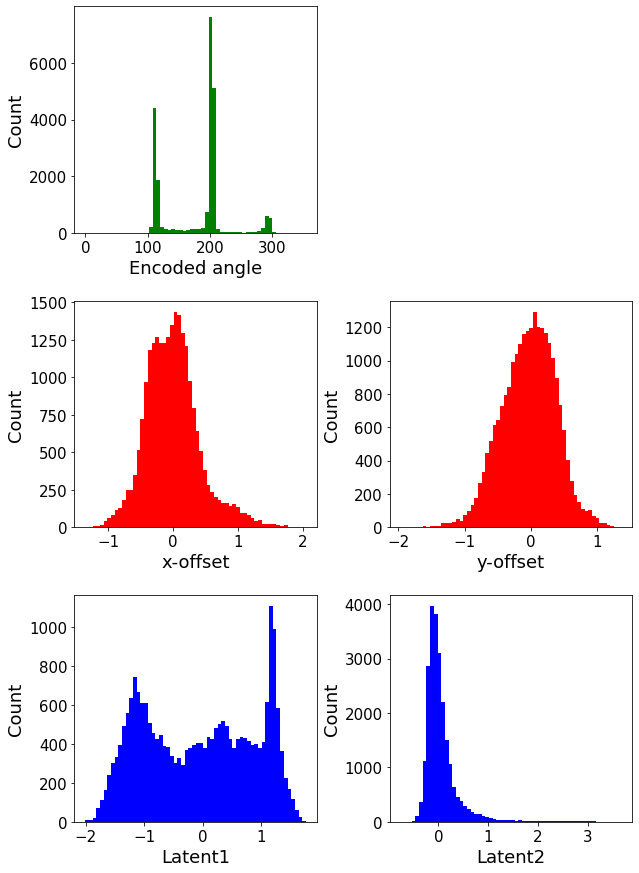

In [ ]:
fig, ax = plt.subplots(3, 2, figsize=(10, 15))
#angles
ax[0,0].hist(np.rad2deg(np.mod(z31+ang_offset,2*np.pi)), bins=np.arange(0,360,6), color='g')
#Latent variable
ax[0,1].set_axis_off()

#Translation/offsets
ax[1,0].hist(z32[:, 0], bins=60, color='r')
ax[1,1].hist(z32[:, 1], bins=60, color='r')

ax[2,0].hist(z33[:, 0], bins=60, color='b')
ax[2,1].hist(z33[:, 1], bins=60, color='b')

ax[0,0].set_xlabel("Encoded angle", fontsize=18)
ax[1,0].set_xlabel("x-offset", fontsize=18)
ax[1,1].set_xlabel("y-offset", fontsize=18)
ax[2,0].set_xlabel("Latent1", fontsize=18)
ax[2,1].set_xlabel("Latent2", fontsize=18)


for _ax in fig.axes:
    _ax.set_ylabel("Count", fontsize=18)
    _ax.tick_params(labelsize=15)
plt.subplots_adjust(wspace=0.3,hspace=0.3)

Text(0.5, 1.0, 'X vs Y offsets, Y-offset colorized')

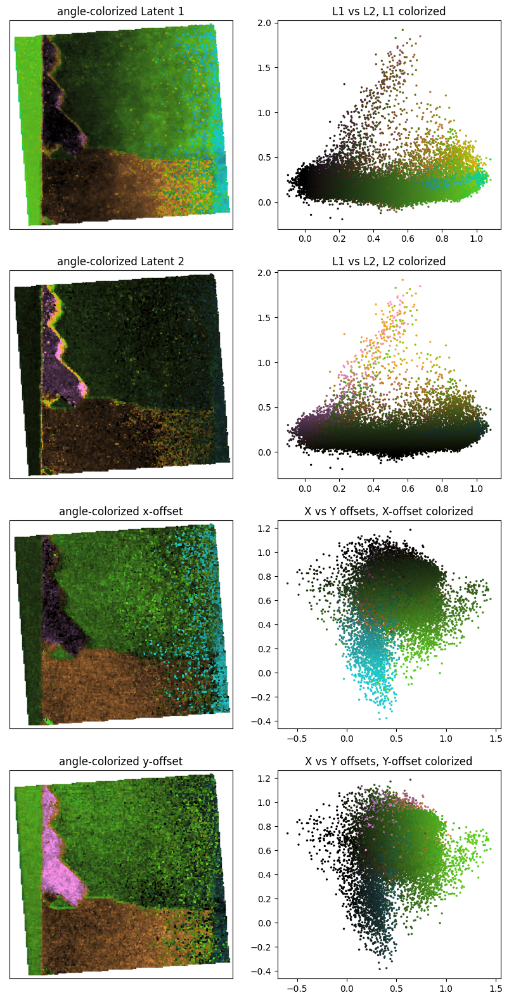

In [ ]:
# Phase Amplitude plots

fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(10, 20), dpi=100)
ax[0,0].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=c31_, s=2, marker='s')
ax[0,0].set_xlim(xl)
ax[0,0].set_ylim(yl)
ax[0,0].set_xticks([])
ax[0,0].set_yticks([])
ax[0,0].set_title('angle-colorized Latent 1')

ax[0,1].scatter(l31,l32,s=2,c=c31_)
ax[0,1].set_title('L1 vs L2, L1 colorized')

ax[1,0].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=c32_, s=2, marker='s')
ax[1,0].set_xlim(xl)
ax[1,0].set_ylim(yl)
ax[1,0].set_xticks([])
ax[1,0].set_yticks([])
ax[1,0].set_title('angle-colorized Latent 2')

ax[1,1].scatter(l31,l32,s=2,c=c32_)
ax[1,1].set_title('L1 vs L2, L2 colorized')


ax[2,0].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=t31_, s=2, marker='s')
ax[2,0].set_xlim(xl)
ax[2,0].set_ylim(yl)
ax[2,0].set_xticks([])
ax[2,0].set_yticks([])
ax[2,0].set_title('angle-colorized x-offset')


ax[2,1].scatter(t21,t22,s=2,c=t31_)
ax[2,1].set_title('X vs Y offsets, X-offset colorized')



ax[3,0].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=t32_, s=2, marker='s')
ax[3,0].set_xlim(xl)
ax[3,0].set_ylim(yl)
ax[3,0].set_xticks([])
ax[3,0].set_yticks([])
ax[3,0].set_title('angle-colorized y-offset')

ax[3,1].scatter(t21,t22,s=2,c=t32_)
ax[3,1].set_title('X vs Y offsets, Y-offset colorized')

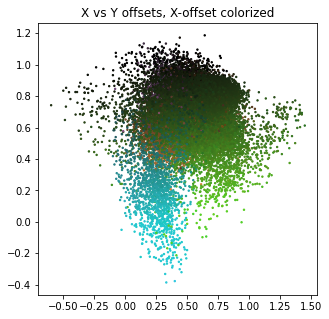

In [ ]:
names = ['L1', 'L2', 'T1', 'T2']
colors = [c31_, c32_, t31_, t32_]

fig, ax = plt.subplots(figsize = (5,5))
ax.scatter(t21,t22,s=2,c=t31_)
ax.set_title('X vs Y offsets, X-offset colorized')
plt.savefig('T1vsT2_T2colorized'+'.png', dpi = 300)


# GMM Analysis

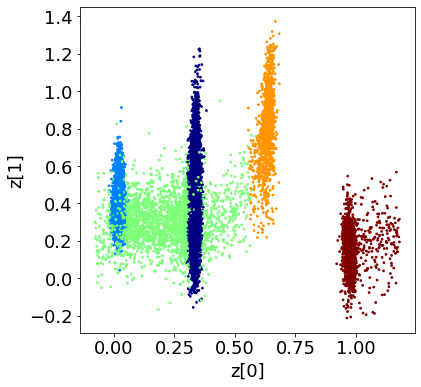

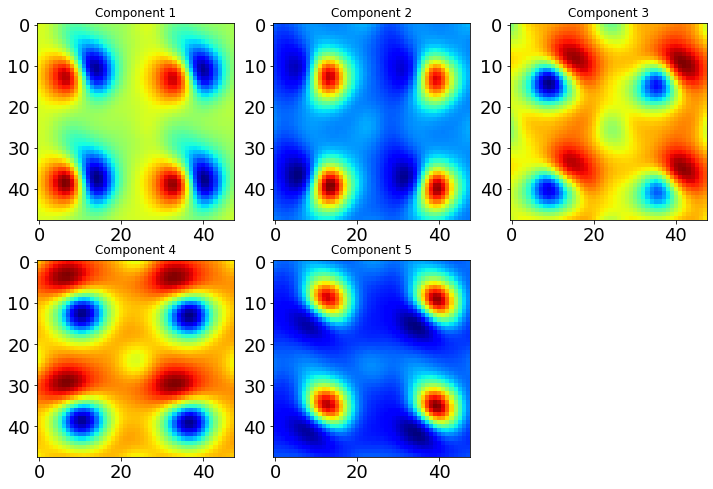

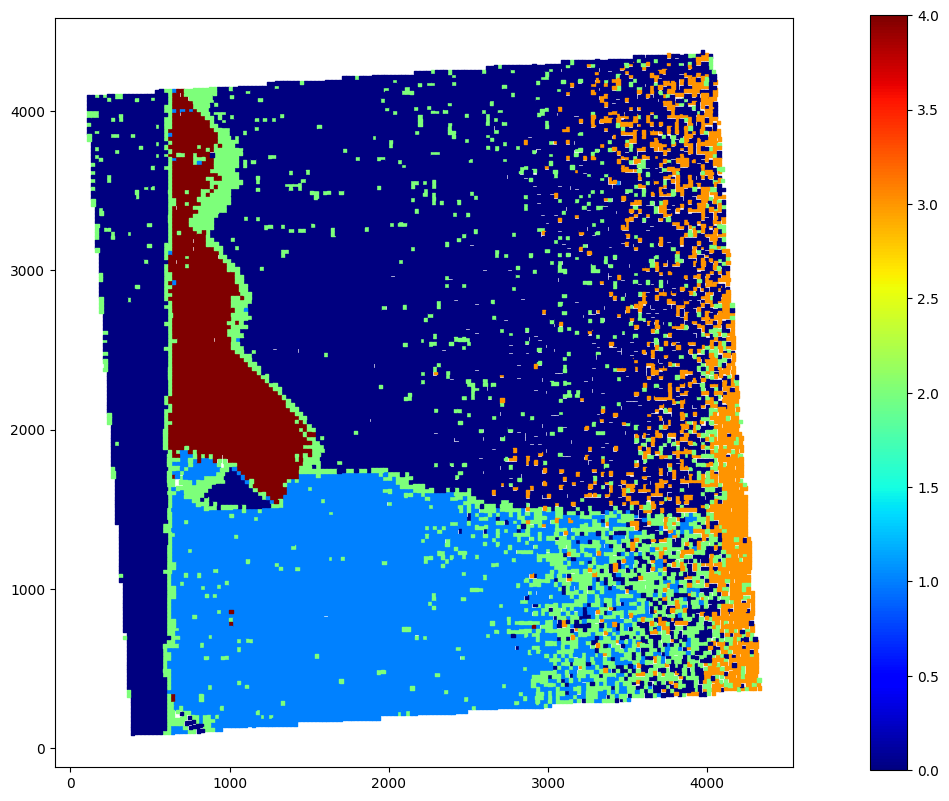

In [ ]:
np.random.seed(512)
random.seed(512)

from re import A
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans


nc = 5

lrng = [1,99]
ang = ang-np.percentile(ang,lrng[0])
ang = (ang/np.percentile(ang,lrng[1]))

z_comb = np.stack((ang, t31, t32, l32)).T # Choose the combination of variables to cluster on
im_cg = feature_arr.mean(axis = 0)

gmmp = GaussianMixture(n_components=nc, covariance_type='full') #diag
gmm_zp = gmmp.fit_predict(z_comb)

fig1 = plt.figure(figsize=(6,6))
plt.scatter(z_comb[:, 0], z_comb[:,1], c=gmm_zp, cmap="jet", s = 3)
plt.xlabel("z[0]", fontsize = 18)
plt.ylabel("z[1]", fontsize = 18)
plt.tick_params(labelsize = 18)

rows = int(np.ceil(float(nc)/4))
colms = int(np.ceil(float(nc)/rows))

gs2 = plt.GridSpec(rows, colms)
fig2 = plt.figure(figsize = (4*colms, 4*(1+rows//1.5)))   
for i in range(nc):
    ax2 = fig2.add_subplot(gs2[i])
    ax2.imshow(feature_arr[gmm_zp == i, :].mean(axis = 0).reshape(48,48) - im_cg, cmap = 'jet')
    ax2.set_title('Component ' + str(i + 1))
    plt.tick_params(labelsize = 18)

gs3 = plt.GridSpec(1, 2, width_ratios=[1,.05])
fig3 = plt.figure(figsize=(11, 10), dpi=100)
ax0 = fig3.add_subplot(gs3[0])
ax1 = fig3.add_subplot(gs3[1])
s1 = ax0.scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=gmm_zp, cmap = "jet", s = 6, marker='s')
ax0.set_aspect(1)
plt.colorbar(s1,cax=ax1)
plt.show()

fig1.savefig(mdirectory+'Lspace clusters.png')
fig2.savefig(mdirectory+'Lspace cluster decoded.png')
fig3.savefig(mdirectory+'Rspace labels.png')

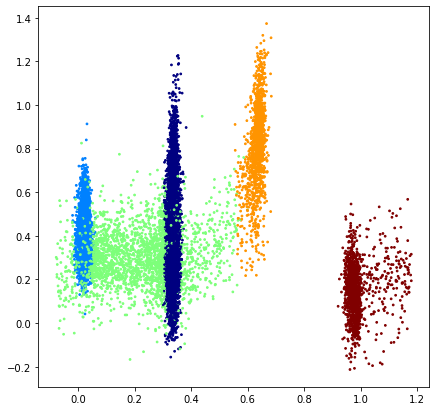

In [ ]:
fig, ax = plt.subplots(figsize=(7,7))
ax.scatter(z_comb[:, 0], z_comb[:,1], c=gmm_zp, cmap="jet", s = 3)
# ax.xlabel("z[0]", fontsize = 18)
# ax.ylabel("z[1]", fontsize = 18)
# ax.tick_params(labelsize = 18)

plt.savefig('anglevsL1_GMMclasses', dpi = 300)

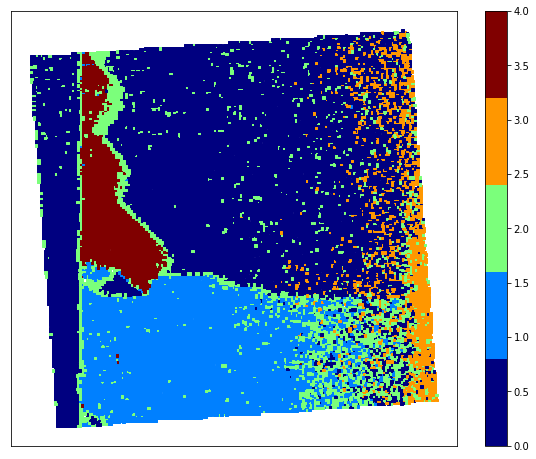

In [ ]:
fig, ax = plt.subplots(figsize = (10,8))
cmap = plt.get_cmap('jet', 5)
s1 = ax.scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=gmm_zp, cmap = cmap, s = 6, marker='s')
ax.set_xticks([])
ax.set_yticks([])
plt.colorbar(s1)
plt.savefig('GMM_results.png', dpi = 500)

**Latent Space Distributions**

User Supplied Offset - visually register rvae orientation w/ experimental Pxy

In [ ]:
#a manual offset to register orientations of rvae to Pxy
ang_offset = np.deg2rad(-100)

Normalized Latent values (used for subsequent colorization)

In [ ]:
l1, l2 = z3[:,0], z3[:,1]

#percentile
lrng = [5,95]
l1 = l1-np.percentile(l1,lrng[0])
l1 = (l1/np.percentile(l1,lrng[1]))

l2 = l2-np.percentile(l2,lrng[0])
l2 = (l2/np.percentile(l2,lrng[1]))

#min/max
"""
l1 = l1-np.min(l1)
l1 = (l1/np.max(l1))#/(2**.5)
l2 = z2[:,1]
l2 = l2-np.min(l2)
l2 = (l2/np.max(l2))#/(2**.5)
"""

'\nl1 = l1-np.min(l1)\nl1 = (l1/np.max(l1))#/(2**.5)\nl2 = z2[:,1]\nl2 = l2-np.min(l2)\nl2 = (l2/np.max(l2))#/(2**.5)\n'

In [ ]:
#Pxy polar coords
Pmag = (np.sum(ap['Pxy'][subI,:]**2,axis=1))**.5 
Pdir = np.arctan2(ap['Pxy'][subI,1],ap['Pxy'][subI,0]).ravel()

Colorization

In [ ]:
np.max(l2)

4.301250336951754

In [ ]:
#Colormaps
my_map = papuc.example_maps.colormaps_CIELAB['perimeter1']  #vector colormap

#latent colors
ang = np.mod(z1+ang_offset,2*np.pi)
c1_ = my_map(ang, np.clip(l1,0,1))
c2_ = my_map(ang, np.clip(l2,0,1))
crvae = my_map(ang, np.ones_like(l1))
#Pxy colors
cP = my_map(Pdir,np.clip(Pmag/np.nanpercentile(Pmag,90),0,1))

papuc/papuc/core.py:28: RuntimeWarning: invalid value encountered in remainder
  values = splev( np.mod(theta-theta0 ,period) +theta0, tck)


KDE

In [ ]:
def gkernel(ins,wincutoff=3):
  if np.size(ins)==1:
    ins = [ins,ins]
  gxv = np.arange(-np.ceil(ins[0])*wincutoff,np.ceil(ins[0])*wincutoff+1)
  gyv = np.arange(-np.ceil(ins[1])*wincutoff,np.ceil(ins[1])*wincutoff+1)
  gxx,gyy = np.meshgrid(gxv, gyv)
  z =  1/(2*np.pi*ins[0]*ins[1]) * np.exp(-.5*gxx**2/ins[0]**2 - .5*gyy**2/ins[1]**2)
  return z

def gkde(ix,iy,ival,s,ixx,iyy):
  #ix & iy is input xy positions
  #ival is the value at the datapoint
  #s = sigma for gausian kernel
  #ixx is x position meshgrid
  #iyy is y position meshgrid

  #get guassian kernel
  k = gkernel(s)

  xv = ixx[0,:]
  yv = iyy[:,0]

  #estimate each datapoint as sum of 4 at integer positions
  stpsz = xv[1]-xv[0]
  xpos = np.floor((ix-xv[0])/stpsz+1).astype('int')     #get first position
  xh = (ix-(xv[xpos-1]))/stpsz                          #fraction of xpos
  xl = 1-xh                                             #fraction of xpos+1
  stpsz = yv[1]-yv[0]
  ypos = np.floor((iy-yv[0])/stpsz+1).astype('int')
  yh = (iy-(yv[ypos-1]))/stpsz
  yl = 1-yh

  #density
  dens = np.zeros_like(ixx).astype('float')
  dens[ypos-1,xpos-1] = dens[ypos-1,xpos-1]   + xl*yl    #p00
  dens[ypos,xpos-1]   = dens[ypos,xpos-1]     + xl*yh    #p10
  dens[ypos-1,xpos]   = dens[ypos-1,xpos]     + xh*yl    #p01
  dens[ypos,xpos]     = dens[ypos,xpos]       + xh*yh    #p11

  #convolve w/ kernel
  densitymap = signal.convolve2d(dens,k,mode='same')

  return densitymap

In [ ]:
#kernel density estimate maps

#L1 vs L2
xystep = .05

#bounds
xmin_l1l2 = np.min(z2[:,0])-1*xystep
xmax_l1l2 = np.max(z2[:,0])+1*xystep
ymin_l1l2 = np.min(z2[:,1])-1*xystep
ymax_l1l2 = np.max(z2[:,1])+1*xystep
xx_l1l2,yy_l1l2 = np.meshgrid(np.arange(xmin_l1l2,xmax_l1l2,xystep),np.arange(ymin_l1l2,ymax_l1l2,xystep))

s=6     #gaussian kernel sigma

dmap_l1l2 = gkde(z2[:,0],z2[:,1],np.ones_like(z2[:,0]),s,xx_l1l2,yy_l1l2)


#angle vs L1
#bounds
astep = 2
xmin_al1 = np.min(np.rad2deg(np.mod(z1+ang_offset,2*np.pi)))-1*astep
xmax_al1 = np.max(np.rad2deg(np.mod(z1+ang_offset,2*np.pi)))+1*astep
ymin_al1 = np.min(z2[:,0])-1*xystep
ymax_al1 = np.max(z2[:,0])+1*xystep
xx_al1,yy_al1 = np.meshgrid(np.arange(xmin_al1,xmax_al1,astep),np.arange(ymin_al1,ymax_al1,xystep))

s=6     #gaussian kernel sigma

dmap_angl1 = gkde(np.rad2deg(np.mod(z1+ang_offset,2*np.pi)),z2[:,0],np.ones_like(z2[:,0]),s,xx_al1,yy_al1)

#angle vs L2
#bounds
astep = 2
xmin_al2 = np.min(np.rad2deg(np.mod(z1+ang_offset,2*np.pi)))-1*astep
xmax_al2 = np.max(np.rad2deg(np.mod(z1+ang_offset,2*np.pi)))+1*astep
ymin_al2 = np.min(z2[:,1])-1*xystep
ymax_al2 = np.max(z2[:,1])+1*xystep
xx_al2,yy_al2 = np.meshgrid(np.arange(xmin_al2,xmax_al2,astep),np.arange(ymin_al2,ymax_al2,xystep))

s=6     #gaussian kernel sigma

dmap_angl2 = gkde(np.rad2deg(np.mod(z1+ang_offset,2*np.pi)),z2[:,1],np.ones_like(z2[:,1]),s,xx_al2,yy_al2)

Display

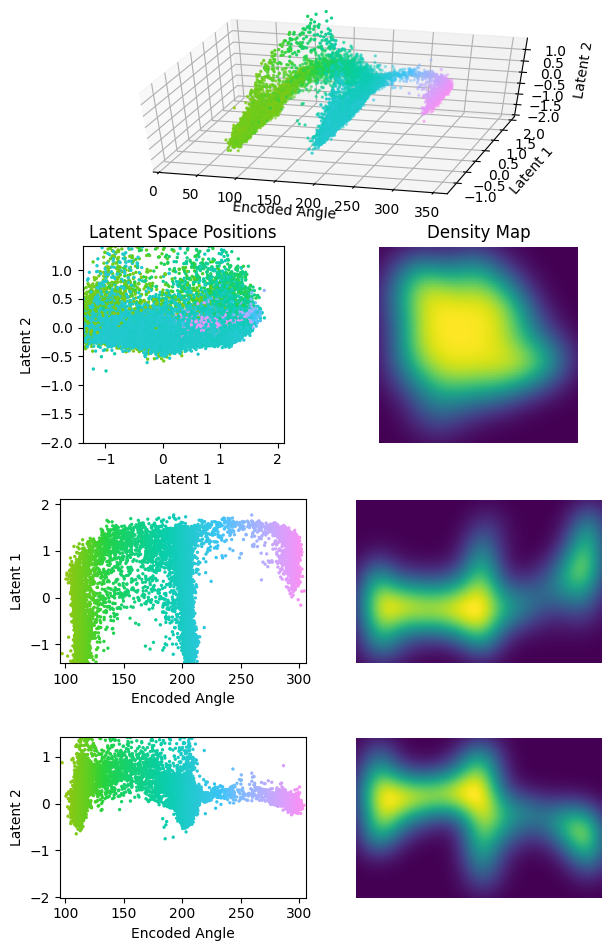

In [ ]:
fig = plt.figure(figsize=(7, 12), dpi=100)

gspec = plt.GridSpec(ncols=2, nrows=4, figure=fig, width_ratios = [1,1], hspace=.2)

#HAADF Main Image
ax0 = fig.add_subplot(gspec[0,:], projection='3d')
ax1 = fig.add_subplot(gspec[1,0])
ax2 = fig.add_subplot(gspec[1,1])
ax3 = fig.add_subplot(gspec[2,0])
ax4 = fig.add_subplot(gspec[2,1])
ax5 = fig.add_subplot(gspec[3,0])
ax6 = fig.add_subplot(gspec[3,1])

ax0.scatter(np.rad2deg(np.mod(z1+ang_offset,2*np.pi)),z3[:,0],z3[:,1],c=crvae,s=2)
ax0.view_init(elev=45, azim=-75)
ax0.set_xlabel('Encoded Angle')
#ax0.set_xlim([np.min(np.rad2deg(np.mod(z1+ang_offset,2*np.pi))),np.max(np.rad2deg(np.mod(z1+ang_offset,2*np.pi)))])
ax0.set_xlim([0,360])
ax0.set_zlim([ymin_l1l2,ymax_l1l2])
ax0.set_zlabel('Latent 2')
ax0.set_ylim([xmin_l1l2,xmax_l1l2])
ax0.set_ylabel('Latent 1')
temp = ax0.get_xlim
#ax0.set_xticks([0,360])
#ax0.set_yticks([xmin_l1l2,0,xmax_l1l2])
#ax0.set_zticks([ymin_l1l2,0,ymax_l1l2])

#L1vsL2
ax1.scatter(z3[:,0],z3[:,1],s=2,c=crvae)
ax1.set_title('Latent Space Positions')
ax1.set_xlim([xmin_l1l2,xmax_l1l2])
ax1.set_xlabel('Latent 1')
ax1.set_ylim([ymin_l1l2,ymax_l1l2])
ax1.set_ylabel('Latent 2')
ax1.set_aspect(xystep/xystep)
ax2.imshow(dmap_l1l2,origin='bottom')
ax2.set_title('Density Map')
ax2.set_xticks([0,np.shape(xx_l1l2)[1]])
ax2.set_xticklabels(['%.2f' % xmin_l1l2, '%.2f' % xmax_l1l2])
ax2.set_xlabel('Latent 1')
ax2.set_yticks([0,np.shape(xx_l1l2)[0]])
ax2.set_yticklabels(['%.2f' % ymin_l1l2, '%.2f' % ymax_l1l2])
ax2.set_ylabel('Latent 2')
ax2.set_axis_off()

#angvsl1
ax3.scatter(np.rad2deg(np.mod(z1+ang_offset,2*np.pi)),z3[:,0],s=2,c=crvae)
#ax3.set_title('Latent Space Positions')
ax3.set_xlim([xmin_al1,xmax_al1])
ax3.set_xlabel('Encoded Angle')
ax3.set_ylim([ymin_al1,ymax_al1])
ax3.set_ylabel('Latent 1')
ax3.set_aspect(astep/xystep)

ax4.imshow(dmap_angl1,origin='bottom')
#ax4.set_title('Density Map')
ax4.set_xticks([0,np.shape(xx_al1)[1]])
ax4.set_xticklabels(['%.2f' % xmin_al1, '%.2f' % xmax_al1])
ax4.set_xlabel('Encoded Angle')
ax4.set_yticks([0,np.shape(xx_al1)[0]])
ax4.set_yticklabels(['%.2f' % ymin_al1, '%.2f' % ymax_al1])
ax4.set_ylabel('Latent 1')
ax4.set_axis_off()

#angvsl1
ax5.scatter(np.rad2deg(np.mod(z1+ang_offset,2*np.pi)),z3[:,1],s=2,c=crvae)
#ax5.set_title('Latent Space Positions')
ax5.set_xlim([xmin_al2,xmax_al2])
ax5.set_xlabel('Encoded Angle')
ax5.set_ylim([ymin_al2,ymax_al2])
ax5.set_ylabel('Latent 2')
ax5.set_aspect(astep/xystep)

ax6.imshow(dmap_angl2,origin='bottom')
#ax6.set_title('Density Map')
ax6.set_xticks([0,np.shape(xx_al2)[1]])
ax6.set_xticklabels(['%.2f' % xmin_al2, '%.2f' % xmax_al2])
ax6.set_xlabel('Encoded Angle')
ax6.set_yticks([0,np.shape(xx_al2)[0]])
ax6.set_yticklabels(['%.2f' % ymin_al2, '%.2f' % ymax_al2])
ax6.set_ylabel('Latent 2')
ax6.set_axis_off()

fig.savefig(mdirectory+'Latent Distribution.png')

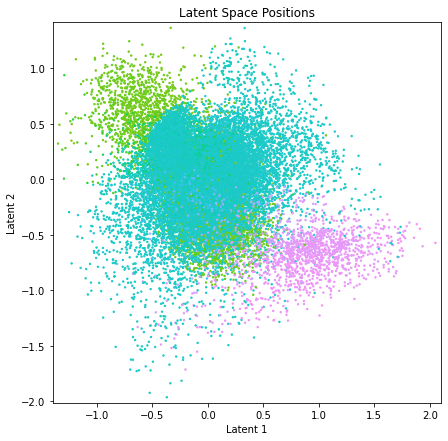

In [ ]:
fig, ax1 = plt.subplots(figsize = (7,7))
ax1.scatter(z2[:,0],z2[:,1],s=2,c=crvae)
ax1.set_title('Latent Space Positions')
ax1.set_xlim([xmin_l1l2,xmax_l1l2])
ax1.set_xlabel('Latent 1')
ax1.set_ylim([ymin_l1l2,ymax_l1l2])
ax1.set_ylabel('Latent 2')
ax1.set_aspect(xystep/xystep)
# ax2.imshow(dmap_l1l2,origin='bottom')
# ax2.set_title('Density Map')
# ax2.set_xticks([0,np.shape(xx_l1l2)[1]])
# ax2.set_xticklabels(['%.2f' % xmin_l1l2, '%.2f' % xmax_l1l2])
# ax2.set_xlabel('Latent 1')
# ax2.set_yticks([0,np.shape(xx_l1l2)[0]])
# ax2.set_yticklabels(['%.2f' % ymin_l1l2, '%.2f' % ymax_l1l2])
# ax2.set_ylabel('Latent 2')
# ax2.set_axis_off()

Histograms

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in remainder
  """


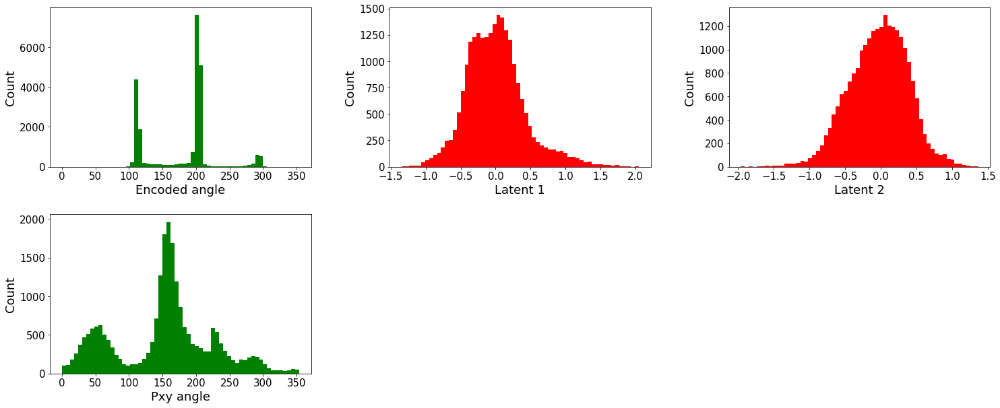

In [ ]:
fig, ax = plt.subplots(2, 3, figsize=(25, 10))
#angles
ax[0,0].hist(np.rad2deg(np.mod(z1+ang_offset,2*np.pi)), bins=np.arange(0,360,6), color='g')

ax[1,0].hist(np.rad2deg(np.mod(Pdir,2*np.pi)), bins=np.arange(0,360,6), color='g')

#ax[0,0].hist(np.mod(z1,2*np.pi), bins=60, color='green', range=((0,2*np.pi)))
ax[0,1].hist(z2[:, 0], bins=60, color='red')
ax[0,2].hist(z2[:, 1], bins=60, color='red')
ax[0,0].set_xlabel("Encoded angle", fontsize=18)
ax[1,0].set_xlabel("Pxy angle", fontsize=18)
ax[0,1].set_xlabel("Latent 1", fontsize=18) #X-offset for rVAE, L1 for rrVAE
ax[0,2].set_xlabel("Latent 2", fontsize=18) #Y-offset for rVAE, L2 for rrVAE

#
ax[1,1].set_axis_off()
ax[1,2].set_axis_off()

for _ax in fig.axes:
    _ax.set_ylabel("Count", fontsize=18)
    _ax.tick_params(labelsize=15)
plt.subplots_adjust(wspace=0.3,hspace=0.3)

fig.savefig(mdirectory+'Latent Histograms.png')

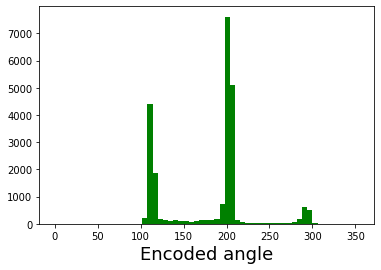

In [ ]:
fig, ax = plt.subplots(figsize = (6,4))
ax.hist(np.rad2deg(np.mod(z1+ang_offset,2*np.pi)), bins=np.arange(0,360,6), color='g')
ax.set_xlabel("Encoded angle", fontsize=18)
plt.savefig('angle_hists.png', dpi = 300)

Real Space Distributions (latent vars)

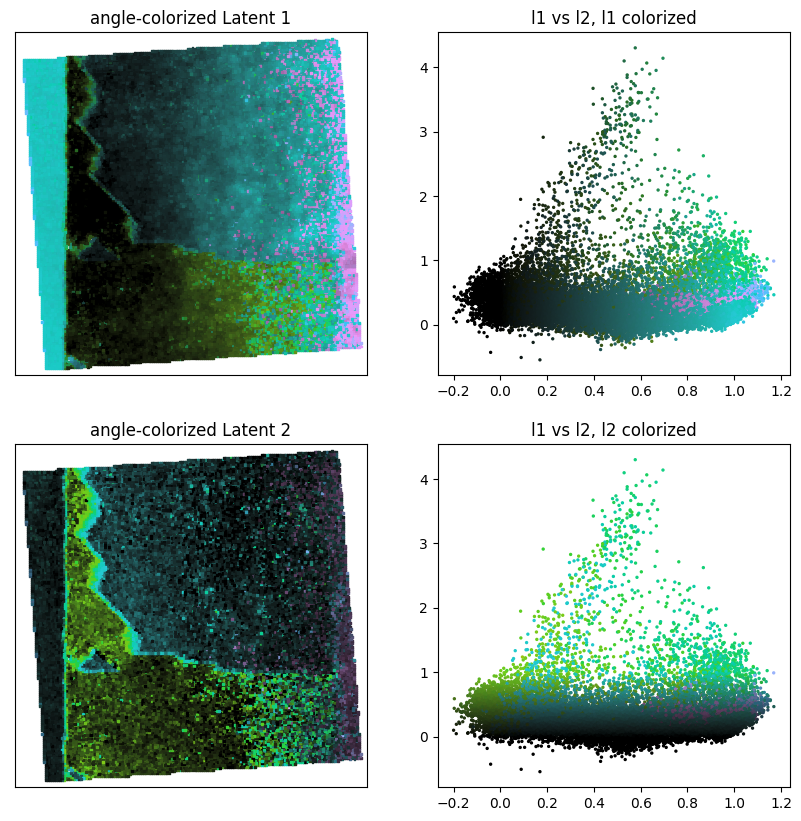

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(10, 10), dpi=100)
ax[0,1].scatter(l1,l2,s=2,c=c1_)
ax[0,1].set_title('l1 vs l2, l1 colorized')
ax[1,1].scatter(l1,l2,s=2,c=c2_)
ax[1,1].set_title('l1 vs l2, l2 colorized')
ax[0,0].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=c1_, s=2, marker='s')
ax[0,0].set_xlim(xl)
ax[0,0].set_ylim(yl)
ax[0,0].set_xticks([])
ax[0,0].set_yticks([])
ax[0,0].set_title('angle-colorized Latent 1')
ax[1,0].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=c2_, s=2, marker='s')
ax[1,0].set_xlim(xl)
ax[1,0].set_ylim(yl)
ax[1,0].set_xticks([])
ax[1,0].set_yticks([])
ax[1,0].set_title('angle-colorized Latent 2')

fig.savefig(mdirectory+'Latent Realspace.png')

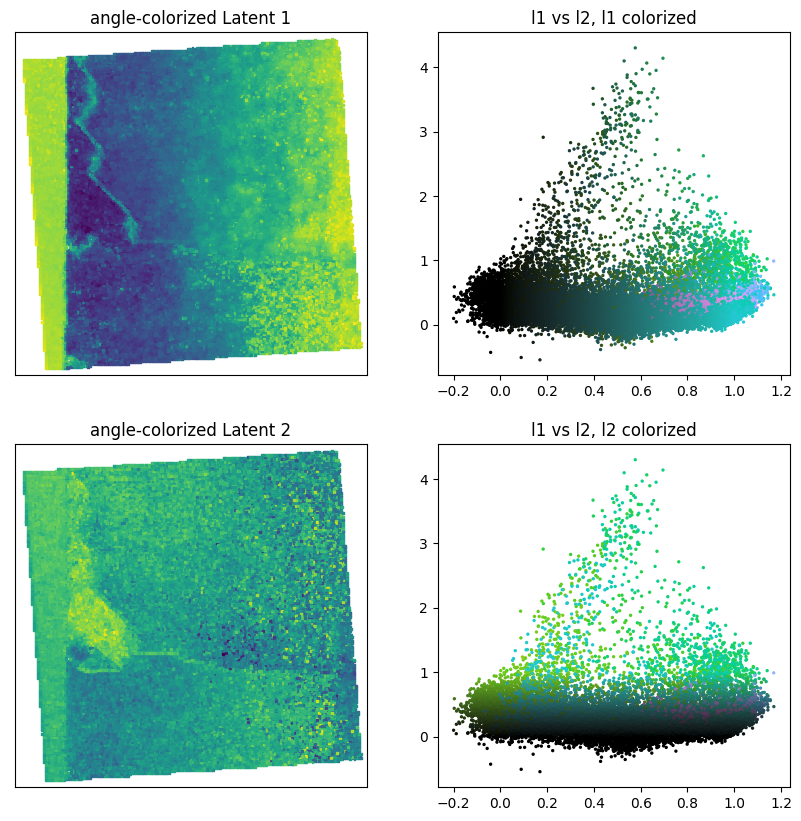

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(10, 10), dpi=100)
ax[0,1].scatter(l1,l2,s=2,c=c1_)
ax[0,1].set_title('l1 vs l2, l1 colorized')
ax[1,1].scatter(l1,l2,s=2,c=c2_)
ax[1,1].set_title('l1 vs l2, l2 colorized')
ax[0,0].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=l1, s=2, marker='s')
ax[0,0].set_xlim(xl)
ax[0,0].set_ylim(yl)
ax[0,0].set_xticks([])
ax[0,0].set_yticks([])
ax[0,0].set_title('angle-colorized Latent 1')
ax[1,0].scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=z2[:,1], s=2, marker='s')
ax[1,0].set_xlim(xl)
ax[1,0].set_ylim(yl)
ax[1,0].set_xticks([])
ax[1,0].set_yticks([])
ax[1,0].set_title('angle-colorized Latent 2')

fig.savefig(mdirectory+'Latent Realspace.png')

In [ ]:
l1.shape

(23340,)

[]

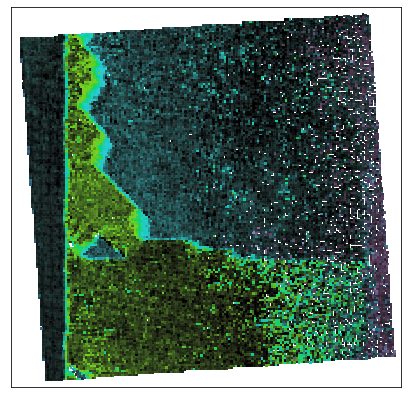

In [ ]:
fig, ax = plt.subplots(figsize=(7, 7))
# ax.scatter(l1,l2,s=2,c=c1_)
# ax.set_title('l1 vs l2, l1 colorized')
# ax.scatter(l1,l2,s=2,c=c2_)
# ax[1,1].set_title('l1 vs l2, l2 colorized')
# ax.scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=c1_, s=2, marker='s')
# ax.set_xlim(xl)
# ax.set_ylim(yl)
# ax.set_xticks([])
# ax.set_yticks([])
# ax[0,0].set_title('angle-colorized Latent 1')
ax.scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=c2_, s=2, marker='s')
ax.set_xlim(xl)
ax.set_ylim(yl)
ax.set_xticks([])
ax.set_yticks([])
# ax[1,0].set_title('angle-colorized Latent 2')
# plt.savefig('Angle_L2_color', dpi = 300)

Clustering (Sergei's Gaussian Mixture code did a good job labeling the peaks)

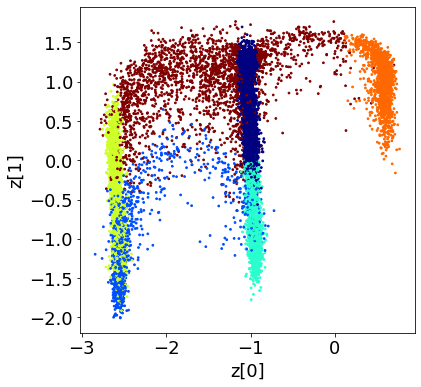

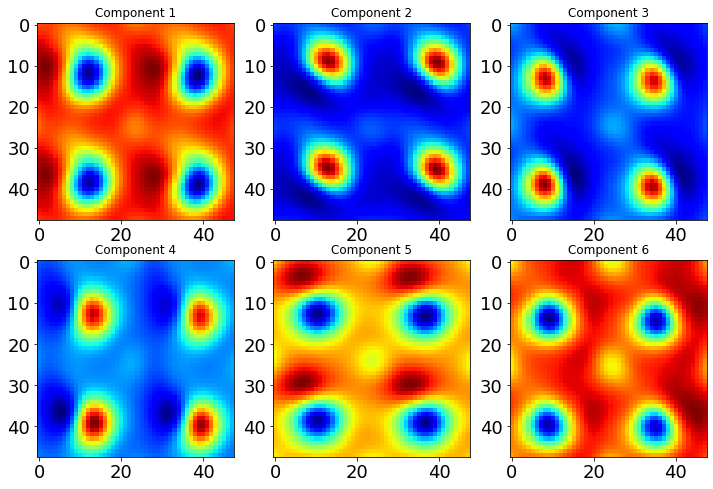

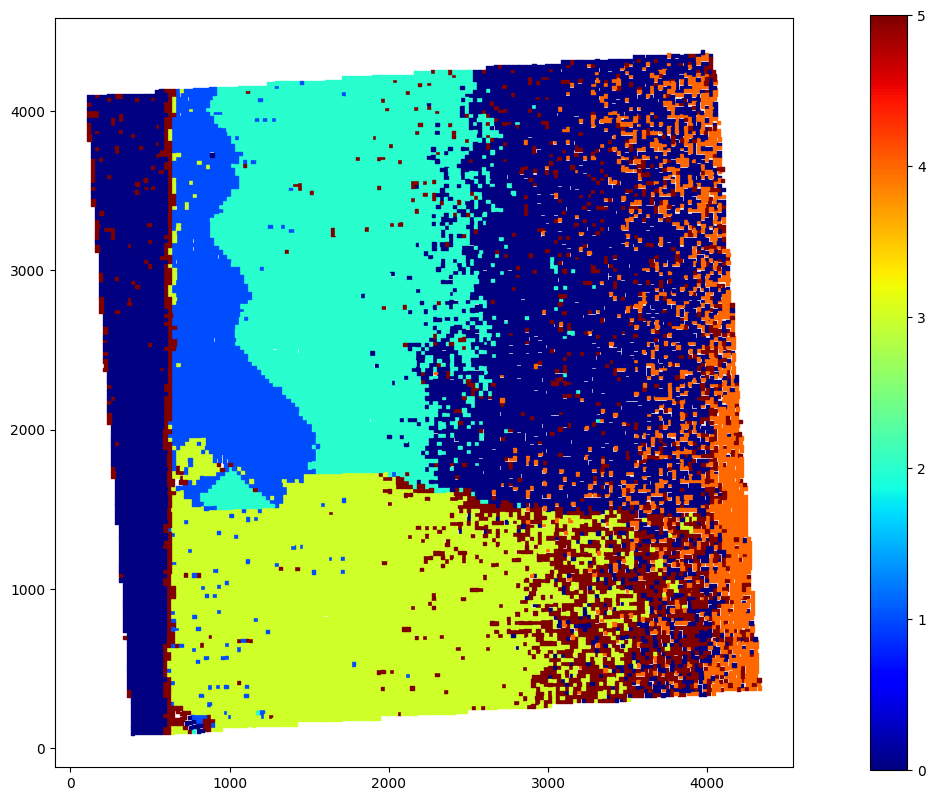

In [ ]:
np.random.seed(512)
random.seed(512)

from re import A
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans

z = z3

nc = 6

a = z2[:,0]
b = z2[:,1]
x = z1
y = z3[:,0]
z = z3[:,1]

z_comb = np.stack((a, b, x,y,z)).T # Choose the combination of variables to cluster on
im_cg = feature_arr.mean(axis = 0)

gmmp = GaussianMixture(n_components=nc, covariance_type='full') #diag
gmm_zp = gmmp.fit_predict(z_comb)

fig1 = plt.figure(figsize=(6,6))
plt.scatter(z_comb[:, 2], z_comb[:,3], c=gmm_zp, cmap="jet", s = 3)
plt.xlabel("z[0]", fontsize = 18)
plt.ylabel("z[1]", fontsize = 18)
plt.tick_params(labelsize = 18)

rows = int(np.ceil(float(nc)/4))
colms = int(np.ceil(float(nc)/rows))

gs2 = plt.GridSpec(rows, colms)
fig2 = plt.figure(figsize = (4*colms, 4*(1+rows//1.5)))   
for i in range(nc):
    ax2 = fig2.add_subplot(gs2[i])
    ax2.imshow(feature_arr[gmm_zp == i, :].mean(axis = 0).reshape(48,48) - im_cg, cmap = 'jet')
    ax2.set_title('Component ' + str(i + 1))
    plt.tick_params(labelsize = 18)

gs3 = plt.GridSpec(1, 2, width_ratios=[1,.05])
fig3 = plt.figure(figsize=(11, 10), dpi=100)
ax0 = fig3.add_subplot(gs3[0])
ax1 = fig3.add_subplot(gs3[1])
s1 = ax0.scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=gmm_zp, cmap = "jet", s = 6, marker='s')
ax0.set_aspect(1)
plt.colorbar(s1,cax=ax1)
plt.show()

fig1.savefig(mdirectory+'Lspace clusters.png')
fig2.savefig(mdirectory+'Lspace cluster decoded.png')
fig3.savefig(mdirectory+'Rspace labels.png')

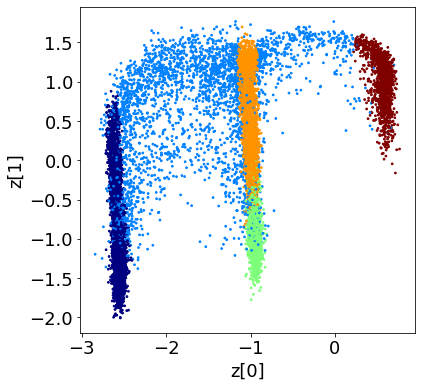

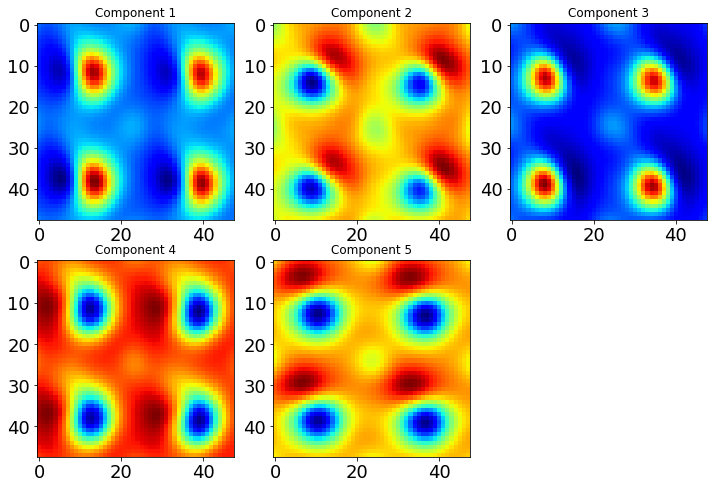

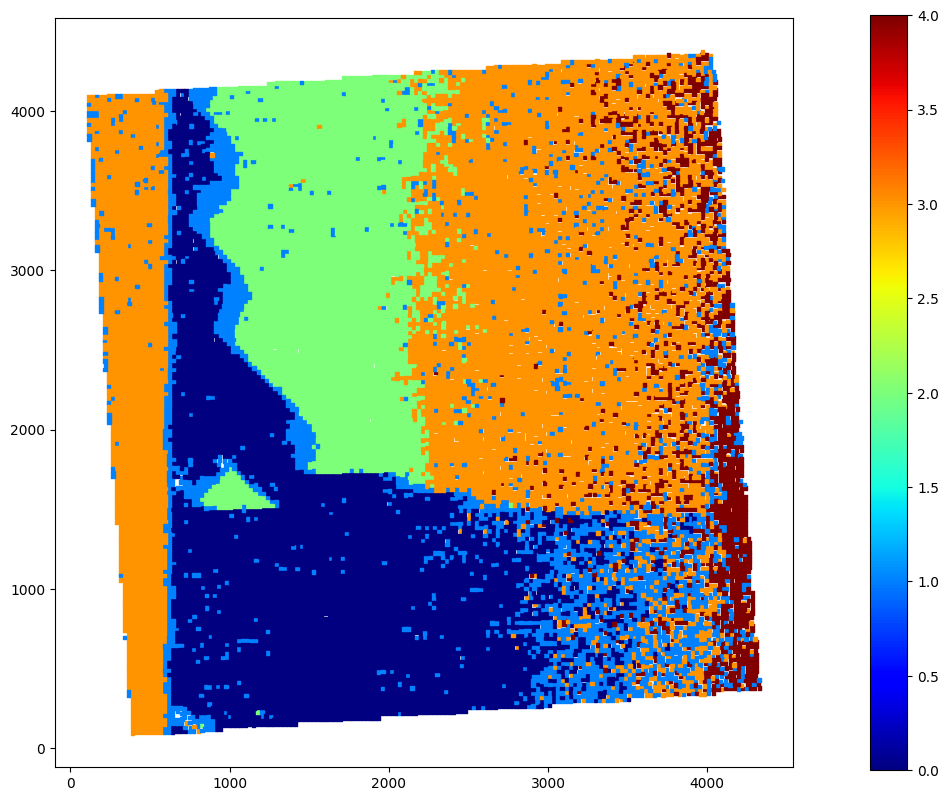

In [ ]:
np.random.seed(521)
random.seed(521)

from re import A
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans

z = z3

nc = 5


x = z1
y = z3[:,0]
z = z3[:,1]

z_comb = np.stack((x,y,z)).T # Choose the combination of variables to cluster on
im_cg = feature_arr.mean(axis = 0)

gmmp = GaussianMixture(n_components=nc, covariance_type='full') #diag
gmm_zp = gmmp.fit_predict(z_comb)

fig1 = plt.figure(figsize=(6,6))
plt.scatter(z_comb[:, 0], z_comb[:,1], c=gmm_zp, cmap="jet", s = 3)
plt.xlabel("z[0]", fontsize = 18)
plt.ylabel("z[1]", fontsize = 18)
plt.tick_params(labelsize = 18)

rows = int(np.ceil(float(nc)/4))
colms = int(np.ceil(float(nc)/rows))

gs2 = plt.GridSpec(rows, colms)
fig2 = plt.figure(figsize = (4*colms, 4*(1+rows//1.5)))   
for i in range(nc):
    ax2 = fig2.add_subplot(gs2[i])
    ax2.imshow(feature_arr[gmm_zp == i, :].mean(axis = 0).reshape(48,48) - im_cg, cmap = 'jet')
    ax2.set_title('Component ' + str(i + 1))
    plt.tick_params(labelsize = 18)

gs3 = plt.GridSpec(1, 2, width_ratios=[1,.05])
fig3 = plt.figure(figsize=(11, 10), dpi=100)
ax0 = fig3.add_subplot(gs3[0])
ax1 = fig3.add_subplot(gs3[1])
s1 = ax0.scatter(ap['xy'][subI,0], ap['xy'][subI,1], c=gmm_zp, cmap = "jet", s = 6, marker='s')
ax0.set_aspect(1)
plt.colorbar(s1,cax=ax1)
plt.show()

fig1.savefig(mdirectory+'Lspace clusters.png')
fig2.savefig(mdirectory+'Lspace cluster decoded.png')
fig3.savefig(mdirectory+'Rspace labels.png')

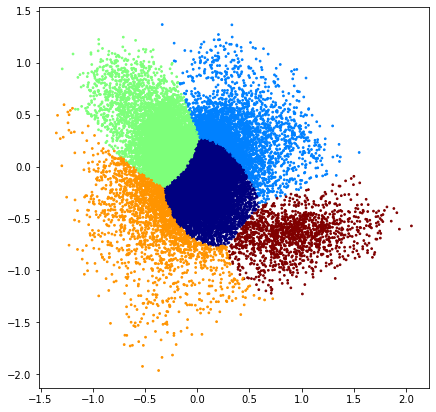

In [ ]:
fig, ax = plt.subplots(figsize = (7,7))
ax.scatter(z_comb[:, 0], z_comb[:,1], c=gmm_zp, cmap="jet", s = 3)
# plt.xlabel("z[0]", fontsize = 18)
# plt.ylabel("z[1]", fontsize = 18)
# plt.tick_params(labelsize = 18)